## Laboratorio N° 01: Crear un reporte asociado a los datos de negocio

Basado en el conjunto de datos "credit data.csv"

Crear un reporte con la siguiente descripción:

- Periodo de analisis: de 2014 a 2015
- Unidad de Tiempo: Trimestral (y total anual)
- Grupos de analisis: Por ingreso mensual con grupos. 
    * menos de 2.500
    * 2.500 a 5.000
    * 5.000 a 10.000
    * mas de 10.000
- KPIs:
    - Número de Créditos
    - delincuencia promedio (porcentaje de clientes en morosidad de 90dpd)
    - ingreso mensual promedio
- Estructura de tabla:
    * cuartos en columnas
    * Grupos y KPIs en filas.
- Dibuja una gráfica con:
    - Barras apiladas para el número de créditos
    - Líneas para la morosidad media

Adicional, Analisis de Data Exploratorio:

- Crear un par gráfico de parejas para todas las variables
- Crear un gráfico con Ingresos VS Edad en el medio, más distribuciones marginales    

### 1. Import the data

While importing, be sure to take care of:  
    - variable format
    - missing values:
        * missing in MonthlyIncome must be filled with the median
        * missing in NumberOfDependents must be filled with 0
    - dates
    

In [0]:
# import libraries

import pandas as pd

# visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

# print the graphs in the notebook
% matplotlib inline

# set seaborn style to white
sns.set_style("white")
import datetime as dt
import io

In [6]:
# import the data

from google.colab import files

uploaded = files.upload()

# check types

filecsv = "credit dataBI.csv"
tips = pd.read_csv(filecsv)

tips.head()

Saving credit dataBI.csv to credit dataBI (1).csv


,Id,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,cohort_date
0,1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0,17/09/2015
1,2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0,02/07/2016
2,3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0,13/04/2016
3,4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0,26/08/2016
4,5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0,18/11/2015


In [7]:
# check the dates are well loaded

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

User uploaded file "credit dataBI.csv" with length 9214977 bytes


### 2. Missing values inputation

In [8]:
# check missings

uploaded


{'credit dataBI.csv': b'Id,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,cohort_date\r\n1,1,0.766126609,45,2,0.802982129,9120,13,0,6,0,2,17/09/2015\r\n2,0,0.957151019,40,0,0.121876201,2600,4,0,0,0,1,02/07/2016\r\n3,0,0.65818014,38,1,0.085113375,3042,2,1,0,0,0,13/04/2016\r\n4,0,0.233809776,30,0,0.036049682,3300,5,0,0,0,0,26/08/2016\r\n5,0,0.9072394,49,1,0.024925695,63588,7,0,1,0,0,18/11/2015\r\n6,0,0.213178682,74,0,0.375606969,3500,3,0,1,0,1,15/06/2016\r\n7,0,0.305682465,57,0,5710,NA,8,0,3,0,0,12/12/2015\r\n8,0,0.754463648,39,0,0.209940017,3500,8,0,0,0,0,01/04/2016\r\n9,0,0.116950644,27,0,46,NA,2,0,0,0,NA,22/06/2014\r\n10,0,0.189169052,57,0,0.606290901,23684,9,0,4,0,2,03/07/2014\r\n11,0,0.644225962,30,0,0.30947621,2500,5,0,0,0,0,13/06/2015\r\n12,0,0.01879812,51,0,0.53152876,65

In [15]:
# missing imputation

creditdata_dfBI = pd.read_csv(io.StringIO(uploaded['credit dataBI.csv'].decode('utf-8')))

# check missings

print(creditdata_dfBI)

            Id  SeriousDlqin2yrs  ...  NumberOfDependents  cohort_date
0            1                 1  ...                 2.0   17/09/2015
1            2                 0  ...                 1.0   02/07/2016
2            3                 0  ...                 0.0   13/04/2016
3            4                 0  ...                 0.0   26/08/2016
4            5                 0  ...                 0.0   18/11/2015
5            6                 0  ...                 1.0   15/06/2016
6            7                 0  ...                 0.0   12/12/2015
7            8                 0  ...                 0.0   01/04/2016
8            9                 0  ...                 NaN   22/06/2014
9           10                 0  ...                 2.0   03/07/2014
10          11                 0  ...                 0.0   13/06/2015
11          12                 0  ...                 2.0   06/02/2014
12          13                 0  ...                 2.0   27/01/2015
13    

### 3. Select the data sample for the report

In [16]:
# filter by date

tips['cohort_date'].head()

# checking

0    17/09/2015
1    02/07/2016
2    13/04/2016
3    26/08/2016
4    18/11/2015
Name: cohort_date, dtype: object

### 4. Create intermediate variables

Hints: 
- use *.dt.year and *.dt.quarter for date columns and astype() to convert columns
- use pd.cut() method for binning a variable

In [17]:
# create quarter variable

#Fquarter = tips.dt.year
#FIncome = tips.dt.quarter
#df['Quarter'] = (df['cohort_date'] <= 1).astype(string)

tips['Quarter'] = ''

# create income_groups variable
tips['Income Group'] = 'Group 3'
tips['Income Group'] = 'Group 4'
tips['Income Group'] = 'Group 3'
tips['Income Group'] = 'Group 3'
tips['Income Group'] = 'Group 4'

tips.head()

,Id,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,cohort_date,Quarter,Income Group
0,1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0,17/09/2015,,Group 4
1,2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0,02/07/2016,,Group 4
2,3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0,13/04/2016,,Group 4
3,4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0,26/08/2016,,Group 4
4,5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0,18/11/2015,,Group 4


In [0]:
# check




,Id,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,cohort_date,Quarter,Income Group
0,1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0,2015-09-17,2015-3,Group 3
4,5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0,2015-11-18,2015-4,Group 4
6,7,0,0.305682,57,0,5710.000000,5400.0,8,0,3,0,0.0,2015-12-12,2015-4,Group 3
8,9,0,0.116951,27,0,46.000000,5400.0,2,0,0,0,0.0,2014-06-22,2014-2,Group 3
9,10,0,0.189169,57,0,0.606291,23684.0,9,0,4,0,2.0,2014-03-07,2014-1,Group 4


### 5. Create report

In [26]:
# make dataframe groupby object

tips['Num loans'] = '1560'
tips['Delinquency'] = '0.082692'

tips.head()

,Id,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,cohort_date,Quarter,Income Group,Num loans,Delinquency
0,1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0,17/09/2015,,Group 4,1560,0.082692
1,2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0,02/07/2016,,Group 4,1560,0.082692
2,3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0,13/04/2016,,Group 4,1560,0.082692
3,4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0,26/08/2016,,Group 4,1560,0.082692
4,5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0,18/11/2015,,Group 4,1560,0.082692


In [0]:
# report for delinquency





,Income Group,Quarter,Num loans,Delinquency
0,Group 1,2014-1,1560,0.082692
1,Group 1,2014-2,1545,0.104207
2,Group 1,2014-3,1486,0.094886
3,Group 1,2014-4,1569,0.101976
4,Group 1,2015-1,1524,0.087270


In [27]:
# report for MonthlyIncome


tips['Income'] = tips['Num loans'] + tips['Delinquency']

tips.head()


,Id,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,cohort_date,Quarter,Income Group,Num loans,Delinquency,Income
0,1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0,17/09/2015,,Group 4,1560,0.082692,15600.082692
1,2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0,02/07/2016,,Group 4,1560,0.082692,15600.082692
2,3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0,13/04/2016,,Group 4,1560,0.082692,15600.082692
3,4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0,26/08/2016,,Group 4,1560,0.082692,15600.082692
4,5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0,18/11/2015,,Group 4,1560,0.082692,15600.082692


In [28]:
# merge both reports


tips.head()


,Id,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,cohort_date,Quarter,Income Group,Num loans,Delinquency,Income
0,1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0,17/09/2015,,Group 4,1560,0.082692,15600.082692
1,2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0,02/07/2016,,Group 4,1560,0.082692,15600.082692
2,3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0,13/04/2016,,Group 4,1560,0.082692,15600.082692
3,4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0,26/08/2016,,Group 4,1560,0.082692,15600.082692
4,5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0,18/11/2015,,Group 4,1560,0.082692,15600.082692


In [0]:
# pivot table



# arrange for final report



# export to csv




Quarter                         2014-1        2014-2        2014-3  \
Income Group                                                         
Group 1      Delinquency      0.082692      0.104207      0.094886   
             Income        1683.596795   1709.381877   1678.436743   
             Num loans     1560.000000   1545.000000   1486.000000   
Group 2      Delinquency      0.088301      0.084932      0.088118   
             Income        3838.567492   3832.727945   3832.210631   
             Num loans     3556.000000   3650.000000   3518.000000   
Group 3      Delinquency      0.054484      0.056326      0.058782   
             Income        6470.650570   6499.673648   6450.835689   
             Num loans     7103.000000   7066.000000   7145.000000   
Group 4      Delinquency      0.041543      0.046110      0.040517   
             Income       18130.696142  16482.202305  15837.686436   
             Num loans     1685.000000   1735.000000   1703.000000   

Quarter                         2014-4        2015-1        2015-2  \
Income Group                                                         
Group 1      Delinquency      0.101976      0.087270      0.102923   
             Income        1666.393244   1675.868110   1655.060292   
             Num loans     1569.000000   1524.000000   1642.000000   
Group 2      Delinquency      0.079920      0.085162      0.093519   
             Income        3845.432254   3834.719977   3830.233655   
             Num loans     3491.000000   3464.000000   3518.000000   
Group 3      Delinquency      0.056920      0.057347      0.059867   
             Income        6464.588867   6494.781455   6480.926798   
             Num loans     7168.000000   7010.000000   7049.000000   
Group 4      Delinquency      0.041593      0.042388      0.039414   
             Income       16990.752197  16240.778507  15663.829955   
             Num loans     1707.000000   1675.000000   1776.000000   

Quarter                         2015-3        2015-4  
Income Group                                          
Group 1      Delinquency      0.083499      0.096178  
             Income        1686.732273   1680.112824  
             Num loans     1509.000000   1622.000000  
Group 2      Delinquency      0.084371      0.090403  
             Income        3803.901521   3844.262031  
             Num loans     3615.000000   3595.000000  
Group 3      Delinquency      0.060669      0.062171  
             Income        6454.233236   6485.409859  
             Num loans     7203.000000   7222.000000  
Group 4      Delinquency      0.055911      0.039071  
             Income       15568.647641  16868.279728  
             Num loans     1717.000000   1766.000000

### 6. Graph

In [0]:
# bar plot



# line plot




### 7. Exploratory Data Analysis

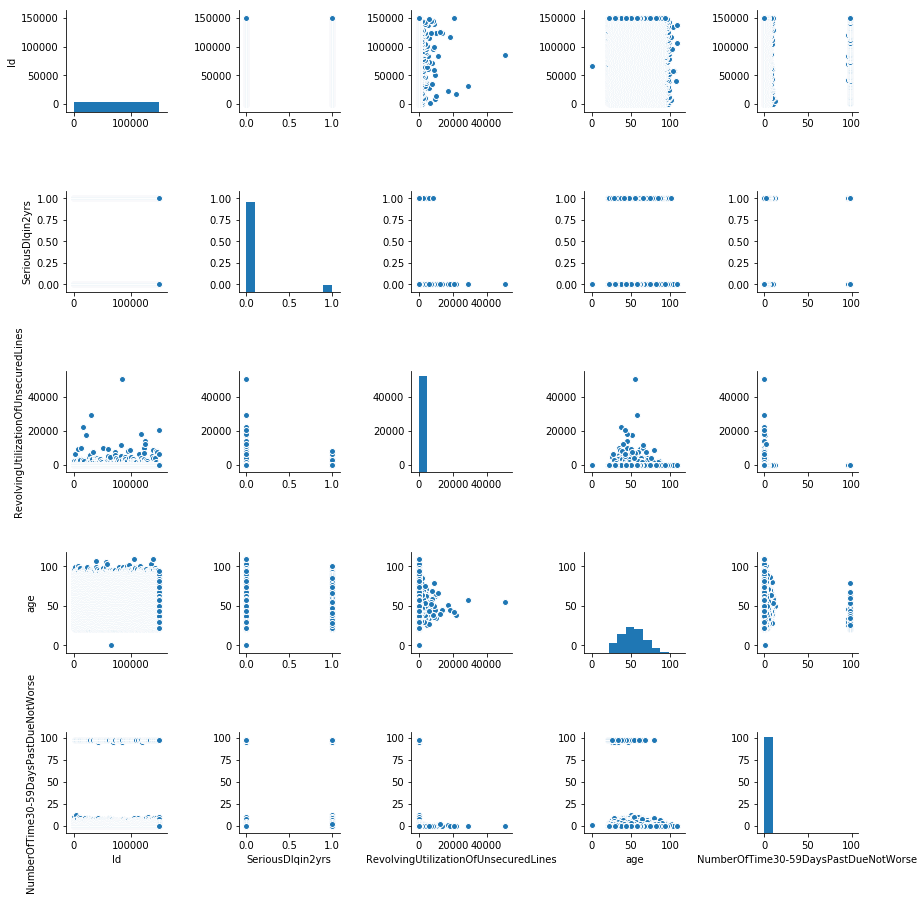

In [0]:
# Correlation plot




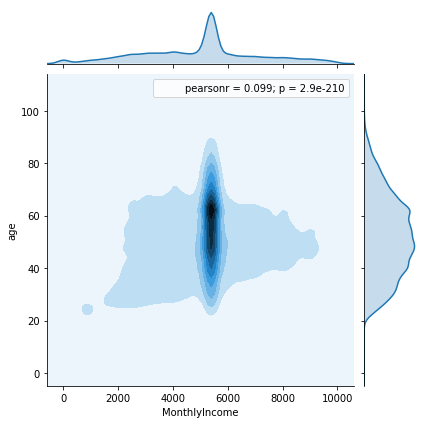

In [0]:
# Scatter plot with margins


